# Title: Multi-object Recognizer

### Importing the libraries

In [5]:
import ssl
import PIL
import time
import pathlib
import numpy as np
import tensorflow as tf
from tensorflow import keras
import matplotlib.pyplot as plt
from tensorflow.keras import layers
from sklearn.metrics import accuracy_score
from tensorflow.keras.models import Sequential
from sklearn.metrics import classification_report
from keras.preprocessing.image import ImageDataGenerator
from tf_explain.callbacks.grad_cam import GradCAMCallback
from tf_explain.callbacks.smoothgrad import SmoothGrad
from tf_explain.core.integrated_gradients import IntegratedGradients
from tf_explain.core.occlusion_sensitivity import OcclusionSensitivity

In [6]:
tf.__version__

'2.8.0'

### Importing the Dataset

In [7]:
data_dir = ".//vehicles_images"

## Part 1 - Data Preprocessing

### Preprocessing the Training set

In [8]:
batch_size = 32
img_height = 180
img_width = 180

train_set = tf.keras.preprocessing.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 4318 files belonging to 4 classes.
Using 3455 files for training.


### Preprocessing the Test set

In [9]:
val_ds = tf.keras.preprocessing.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="validation",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

class_names = train_set.class_names
print(class_names)

Found 4318 files belonging to 4 classes.
Using 863 files for validation.
['bus', 'motorcycle', 'plane', 'train']


### Scaling of Dataset

In [10]:
AUTOTUNE = tf.data.AUTOTUNE

train_set = train_set.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)


normalization_layer = layers.experimental.preprocessing.Rescaling(1./255)

normalized_ds = train_set.map(lambda x, y: (normalization_layer(x), y))
image_batch, labels_batch = next(iter(normalized_ds))
first_image = image_batch[0]

print(np.min(first_image), np.max(first_image))

num_classes = 4

0.0 0.9838794


## Part 2 - Building the CNN

### Initialising the CNN

* Step 1 - Convolution
* Step 2 - Pooling
* Adding a second convolutional layer
* Step 3 - Flattening
* Step 4 - Full Connection
* Step 5 - Output Layer

In [11]:
cnn = Sequential([
  layers.experimental.preprocessing.Rescaling(1./255, input_shape=(img_height, img_width, 3)),
  layers.Conv2D(filters=32, kernel_size=3,activation='relu'), # Convolution
  layers.MaxPooling2D(pool_size=2, strides=2), #pooling
  layers.Conv2D(filters=32, kernel_size=3,activation='relu'), #Second convolution
  layers.MaxPooling2D(pool_size=2, strides=2),
  layers.Dense(128, activation='relu'), #Full connection
  layers.Flatten(), #flattening
  layers.Dense(num_classes, activation = 'sigmoid') #output layer
])

## Part 3 - Training the CNN

### Compiling the CNN

In [12]:
cnn.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

### Training the CNN on the Training set and evaluating it on the Test set

In [13]:
start = time.time()
epochs=10
history = cnn.fit(
  train_set,
  validation_data=val_ds,
  epochs=epochs
)

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

stop = time.time()
cnnT = (stop-start)
cnnT

Epoch 1/10


C:\Users\user\anaconda3\lib\site-packages\tensorflow\python\util\dispatch.py:1082: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a sigmoid or softmax activation and thus does not represent logits. Was this intended?"
  return dispatch_target(*args, **kwargs)


108/108 [==============================] - 97s 889ms/step - loss: 1.2469 - accuracy: 0.4576 - val_loss: 1.0672 - val_accuracy: 0.5747
Epoch 2/10
108/108 [==============================] - 86s 798ms/step - loss: 0.9856 - accuracy: 0.5997 - val_loss: 1.0154 - val_accuracy: 0.5817
Epoch 3/10
108/108 [==============================] - 88s 815ms/step - loss: 0.8202 - accuracy: 0.6842 - val_loss: 1.0321 - val_accuracy: 0.5875
Epoch 4/10
108/108 [==============================] - 89s 828ms/step - loss: 0.6198 - accuracy: 0.7661 - val_loss: 1.1185 - val_accuracy: 0.5875
Epoch 5/10
108/108 [==============================] - 87s 805ms/step - loss: 0.4064 - accuracy: 0.8622 - val_loss: 1.3191 - val_accuracy: 0.5469
Epoch 6/10
108/108 [==============================] - 88s 817ms/step - loss: 0.2965 - accuracy: 0.9195 - val_loss: 1.4639 - val_accuracy: 0.5504
Epoch 7/10
108/108 [==============================] - 87s 804ms/step - loss: 0.2500 - accuracy: 0.9326 - val_loss: 1.5959 - val_accuracy: 0.5

878.0821042060852

## Part 4 - Visualizing Model 1

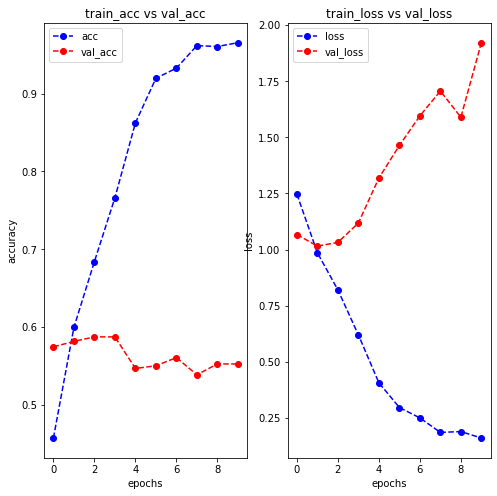

In [14]:
fig = plt.figure(figsize=(8,8))

# Plot accuracy
plt.subplot(1,2,1)
plt.plot(history.history['accuracy'],'bo--', label = "acc")
plt.plot(history.history['val_accuracy'], 'ro--', label = "val_acc")
plt.title("train_acc vs val_acc")
plt.ylabel("accuracy")
plt.xlabel("epochs")
plt.legend()

# Plot loss function
plt.subplot(1,2,2)
plt.plot(history.history['loss'],'bo--', label = "loss")
plt.plot(history.history['val_loss'], 'ro--', label = "val_loss")
plt.title("train_loss vs val_loss")
plt.ylabel("loss")
plt.xlabel("epochs")

plt.legend()
plt.show()

(32, 180, 180, 3)
(32,)


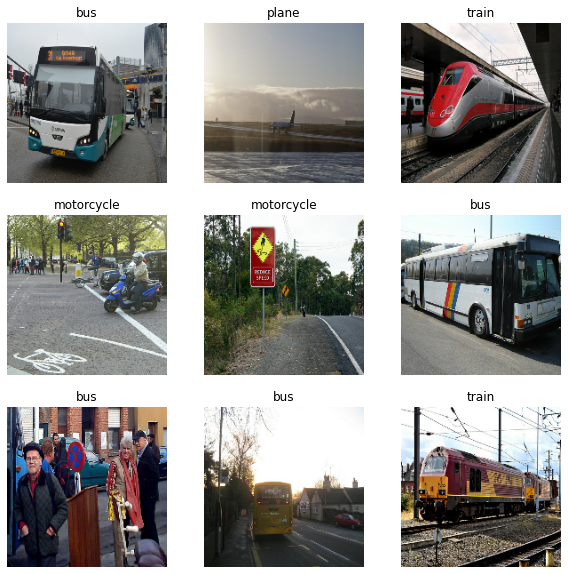

In [15]:
plt.figure(figsize=(10, 10))
for images, labels in train_set.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")

for image_batch, labels_batch in train_set:
    print(image_batch.shape)
    print(labels_batch.shape)
    break

### Data Augmentation

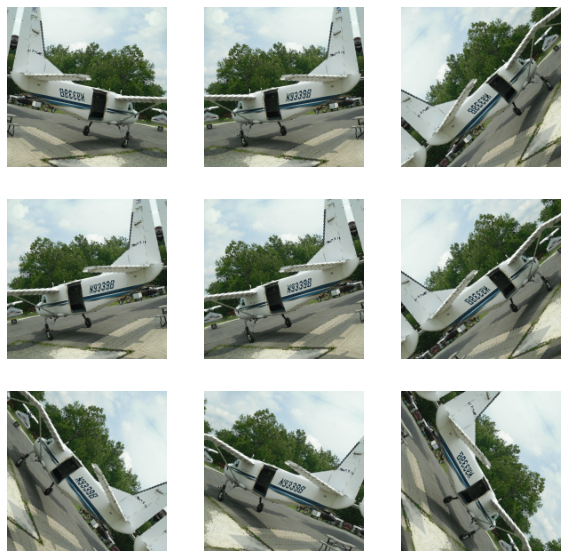

In [16]:
data_augmentation = tf.keras.Sequential([
  tf.keras.layers.experimental.preprocessing.RandomFlip('horizontal'),
  tf.keras.layers.experimental.preprocessing.RandomRotation(0.2),
])

for image, _ in train_set.take(1):
    plt.figure(figsize=(10, 10))
    first_image = image[0]
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        augmented_image = data_augmentation(tf.expand_dims(first_image, 0))
        plt.imshow(augmented_image[0] / 255)
        plt.axis('off')


#### Training the training set on Augmented Data

In [17]:
cnn = Sequential([
  layers.experimental.preprocessing.Rescaling(1./255, input_shape=(img_height, img_width, 3)),
  layers.Conv2D(filters=32, kernel_size=3,activation='relu'), # Convolution
  layers.MaxPooling2D(pool_size=2, strides=2), #pooling
  layers.Conv2D(filters=32, kernel_size=3,activation='relu'), #Second convolution
  layers.MaxPooling2D(pool_size=2, strides=2),
  layers.Dense(128, activation='relu'), #Full connection
  layers.Flatten(), #flattening
  layers.Dense(num_classes, activation = 'sigmoid') #output layer
])

#### Compiling Augmented Data

In [18]:
cnn.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [19]:
start = time.time()
epochs=10
history = cnn.fit(
  train_set,
  validation_data=val_ds,
  epochs=epochs
)

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

stop = time.time()
cnnT = (stop-start)
cnnT

Epoch 1/10
108/108 [==============================] - 84s 775ms/step - loss: 1.4024 - accuracy: 0.4810 - val_loss: 1.0329 - val_accuracy: 0.5678
Epoch 2/10
108/108 [==============================] - 83s 769ms/step - loss: 0.9769 - accuracy: 0.6119 - val_loss: 0.9732 - val_accuracy: 0.6130
Epoch 3/10
108/108 [==============================] - 85s 783ms/step - loss: 0.8131 - accuracy: 0.6871 - val_loss: 0.9576 - val_accuracy: 0.6141
Epoch 4/10
108/108 [==============================] - 87s 808ms/step - loss: 0.6406 - accuracy: 0.7653 - val_loss: 1.0253 - val_accuracy: 0.5944
Epoch 5/10
108/108 [==============================] - 85s 790ms/step - loss: 0.4347 - accuracy: 0.8478 - val_loss: 1.1899 - val_accuracy: 0.5736
Epoch 6/10
108/108 [==============================] - 83s 767ms/step - loss: 0.2909 - accuracy: 0.9166 - val_loss: 1.3067 - val_accuracy: 0.5608
Epoch 7/10
108/108 [==============================] - 83s 773ms/step - loss: 0.2264 - accuracy: 0.9424 - val_loss: 1.3531 - val_ac

840.7008390426636

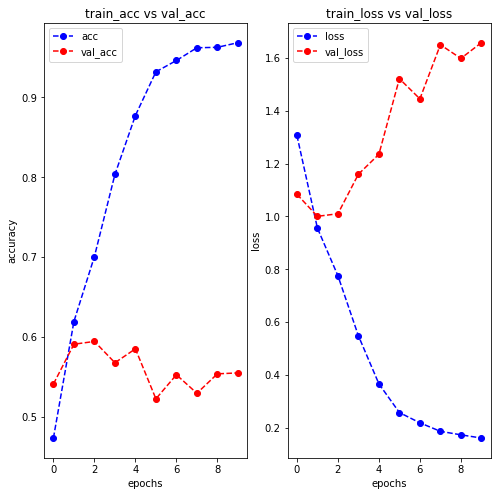

In [23]:
fig = plt.figure(figsize=(8,8))

# Plot accuracy
plt.subplot(1,2,1)
plt.plot(history.history['accuracy'],'bo--', label = "acc")
plt.plot(history.history['val_accuracy'], 'ro--', label = "val_acc")
plt.title("train_acc vs val_acc")
plt.ylabel("accuracy")
plt.xlabel("epochs")
plt.legend()

# Plot loss function
plt.subplot(1,2,2)
plt.plot(history.history['loss'],'bo--', label = "loss")
plt.plot(history.history['val_loss'], 'ro--', label = "val_loss")
plt.title("train_loss vs val_loss")
plt.ylabel("loss")
plt.xlabel("epochs")

plt.legend()
plt.show()

(32, 160, 160, 3)
(32,)


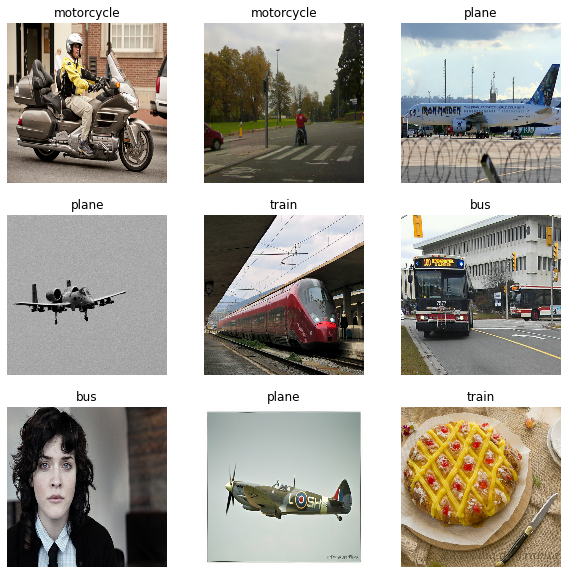

In [24]:
plt.figure(figsize=(10, 10))
for images, labels in train_set.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")

for image_batch, labels_batch in train_set:
    print(image_batch.shape)
    print(labels_batch.shape)
    break

### Pretraining Model 1

#### Training Model 1 at 160x160, Resizing & Scaling, Max pooling, Data augmentation, Training

Found 4318 files belonging to 4 classes.
Using 3455 files for training.
Found 4318 files belonging to 4 classes.
Using 863 files for validation.
['bus', 'motorcycle', 'plane', 'train']
(32, 160, 160, 3)
(32,)
0.0 1.0
Epoch 1/10
108/108 [==============================] - 74s 682ms/step - loss: 1.2137 - accuracy: 0.4695 - val_loss: 1.0625 - val_accuracy: 0.5597
Epoch 2/10
108/108 [==============================] - 65s 606ms/step - loss: 0.9718 - accuracy: 0.6052 - val_loss: 1.0609 - val_accuracy: 0.5678
Epoch 3/10
108/108 [==============================] - 66s 608ms/step - loss: 0.8416 - accuracy: 0.6622 - val_loss: 0.9680 - val_accuracy: 0.6083
Epoch 4/10
108/108 [==============================] - 67s 622ms/step - loss: 0.6402 - accuracy: 0.7566 - val_loss: 1.1547 - val_accuracy: 0.5435
Epoch 5/10
108/108 [==============================] - 67s 616ms/step - loss: 0.4303 - accuracy: 0.8507 - val_loss: 1.1539 - val_accuracy: 0.5863
Epoch 6/10
108/108 [==============================] - 66s 

669.3179335594177

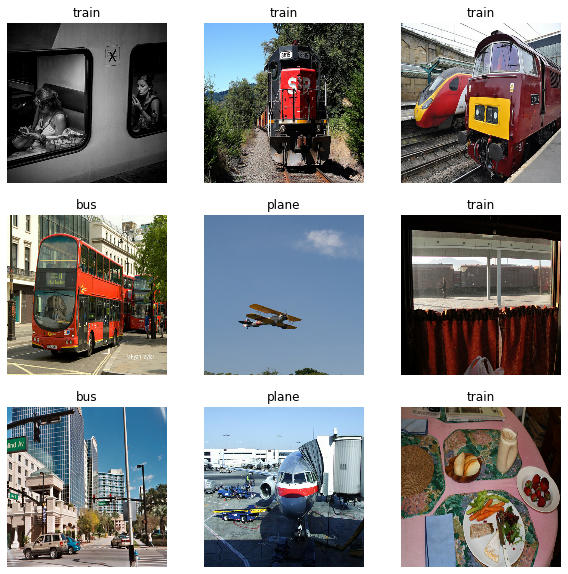

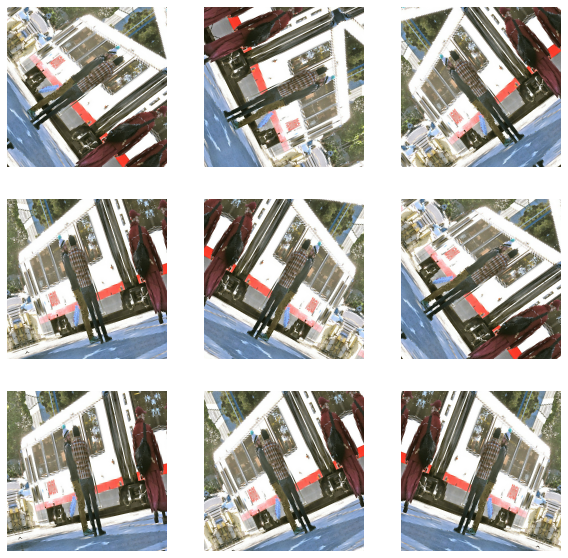

In [25]:
batch_size = 32
img_height = 160
img_width = 160

train_set = tf.keras.preprocessing.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

val_ds = tf.keras.preprocessing.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="validation",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

class_names = train_set.class_names
print(class_names)


plt.figure(figsize=(10, 10))
for images, labels in train_set.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")

for image_batch, labels_batch in train_set:
    print(image_batch.shape)
    print(labels_batch.shape)
    break

    
# Scaling
AUTOTUNE = tf.data.AUTOTUNE

train_set = train_set.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

normalization_layer = layers.experimental.preprocessing.Rescaling(1./255)

normalized_ds = train_set.map(lambda x, y: (normalization_layer(x), y))
image_batch, labels_batch = next(iter(normalized_ds))
first_image = image_batch[0]

print(np.min(first_image), np.max(first_image))

num_classes = 4

#Creating Augmented samples to add to existing data
data_augmentation = tf.keras.Sequential([
  tf.keras.layers.experimental.preprocessing.RandomFlip('horizontal'),    # Data Augumentation
  tf.keras.layers.experimental.preprocessing.RandomRotation(0.2),
])

#Augmentation plot of a sample image
for image, _ in train_set.take(1):
    plt.figure(figsize=(10, 10))
    first_image = image[0]
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        augmented_image = data_augmentation(tf.expand_dims(first_image, 0))
        plt.imshow(augmented_image[0]/255)
        plt.axis('off')



# Convolution
cnn = Sequential([
  layers.experimental.preprocessing.Rescaling(1./255, input_shape=(160, 160, 3)),
  layers.Conv2D(filters=32, kernel_size=3,activation='relu'), # Convolution
  layers.MaxPooling2D(pool_size=2, strides=2), #pooling
  layers.Conv2D(filters=32, kernel_size=3,activation='relu'), #Second convolution
  layers.MaxPooling2D(pool_size=2, strides=2),
  layers.Dense(128, activation='relu'), #Full connection
  layers.Flatten(), #flattening
  layers.Dense(num_classes, activation = 'sigmoid') #output layer
])
# Compiling
cnn.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])
# Training
start = time.time()
epochs=10
history = cnn.fit(
  train_set,
  validation_data=val_ds,
  epochs=epochs
)

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

stop = time.time()
cnnT = (stop-start)
cnnT

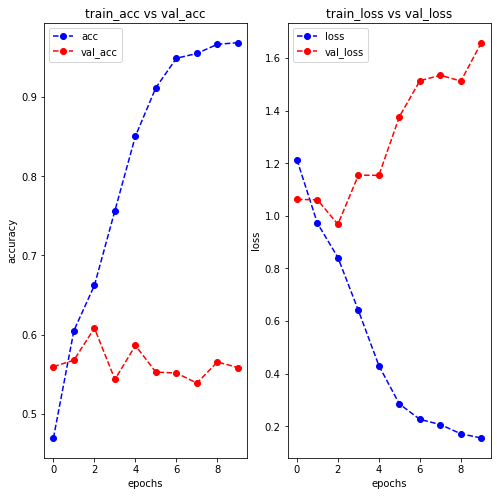

In [26]:
fig = plt.figure(figsize=(8,8))

# Plot accuracy
plt.subplot(1,2,1)
plt.plot(history.history['accuracy'],'bo--', label = "acc")
plt.plot(history.history['val_accuracy'], 'ro--', label = "val_acc")
plt.title("train_acc vs val_acc")
plt.ylabel("accuracy")
plt.xlabel("epochs")
plt.legend()

# Plot loss function
plt.subplot(1,2,2)
plt.plot(history.history['loss'],'bo--', label = "loss")
plt.plot(history.history['val_loss'], 'ro--', label = "val_loss")
plt.title("train_loss vs val_loss")
plt.ylabel("loss")
plt.xlabel("epochs")

plt.legend()
plt.show()

#### Using Pretrained model(ImageNet) as a base

In [27]:
IMG_SIZE =(160,160)
IMG_SHAPE =IMG_SIZE + (3,)
base_model = tf.keras.applications.MobileNetV2(input_shape=IMG_SHAPE,include_top=False,weights='imagenet')
image_batch, labels_batch =next(iter(train_set))
feature_batch = base_model(image_batch)
print(feature_batch.shape)

9420800/9406464 [==============================] - 3s 0us/step
(32, 5, 5, 1280)


In [28]:
base_model.trainable = False
base_model.summary()
global_average_layer=tf.keras.layers.GlobalAveragePooling2D()
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

prediction_layer= tf.keras.layers.Dense(4)
prediction_batch = prediction_layer(feature_batch_average)
print(prediction_batch.shape)

Model: "mobilenetv2_1.00_160"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 160, 160, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 80, 80, 32)   864         ['input_1[0][0]']                
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 80, 80, 32)   128         ['Conv1[0][0]']                  
                                                                                                  
 Conv1_relu (ReLU)              (None, 80, 80, 32)   0           ['bn_Conv1[0][

 nv2D)                                                                                            
                                                                                                  
 block_3_depthwise_BN (BatchNor  (None, 20, 20, 144)  576        ['block_3_depthwise[0][0]']      
 malization)                                                                                      
                                                                                                  
 block_3_depthwise_relu (ReLU)  (None, 20, 20, 144)  0           ['block_3_depthwise_BN[0][0]']   
                                                                                                  
 block_3_project (Conv2D)       (None, 20, 20, 32)   4608        ['block_3_depthwise_relu[0][0]'] 
                                                                                                  
 block_3_project_BN (BatchNorma  (None, 20, 20, 32)  128         ['block_3_project[0][0]']        
 lization)

 ization)                                                                                         
                                                                                                  
 block_7_expand_relu (ReLU)     (None, 10, 10, 384)  0           ['block_7_expand_BN[0][0]']      
                                                                                                  
 block_7_depthwise (DepthwiseCo  (None, 10, 10, 384)  3456       ['block_7_expand_relu[0][0]']    
 nv2D)                                                                                            
                                                                                                  
 block_7_depthwise_BN (BatchNor  (None, 10, 10, 384)  1536       ['block_7_depthwise[0][0]']      
 malization)                                                                                      
                                                                                                  
 block_7_d

 block_10_project_BN (BatchNorm  (None, 10, 10, 96)  384         ['block_10_project[0][0]']       
 alization)                                                                                       
                                                                                                  
 block_11_expand (Conv2D)       (None, 10, 10, 576)  55296       ['block_10_project_BN[0][0]']    
                                                                                                  
 block_11_expand_BN (BatchNorma  (None, 10, 10, 576)  2304       ['block_11_expand[0][0]']        
 lization)                                                                                        
                                                                                                  
 block_11_expand_relu (ReLU)    (None, 10, 10, 576)  0           ['block_11_expand_BN[0][0]']     
                                                                                                  
 block_11_

                                                                                                  
 block_14_depthwise_relu (ReLU)  (None, 5, 5, 960)   0           ['block_14_depthwise_BN[0][0]']  
                                                                                                  
 block_14_project (Conv2D)      (None, 5, 5, 160)    153600      ['block_14_depthwise_relu[0][0]']
                                                                                                  
 block_14_project_BN (BatchNorm  (None, 5, 5, 160)   640         ['block_14_project[0][0]']       
 alization)                                                                                       
                                                                                                  
 block_14_add (Add)             (None, 5, 5, 160)    0           ['block_13_project_BN[0][0]',    
                                                                  'block_14_project_BN[0][0]']    
          

In [29]:
preprocess_input = tf.keras.applications.mobilenet_v2.preprocess_input
inputs = tf.keras.Input(shape = (160, 160, 3))
x = data_augmentation(inputs)
x = preprocess_input(x)
x = base_model(x, training = False)
x = global_average_layer(x)
x = tf.keras.layers.Dropout(0.2)(x)
outputs = prediction_layer(x)
cnn = tf.keras.Model(inputs, outputs)

base_learning_rate = 0.0001
cnn.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = base_learning_rate),
              loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits = True),
              metrics = ['accuracy'])


len(cnn.trainable_variables)

initial_epochs = 10

loss0, accuracy0 = cnn.evaluate(val_ds)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

history = cnn.fit(train_set,
                    epochs = initial_epochs,
                    validation_data = val_ds)

27/27 [==============================] - 13s 430ms/step - loss: 1.5508 - accuracy: 0.3291
initial loss: 1.55
initial accuracy: 0.33
Epoch 1/10
108/108 [==============================] - 67s 594ms/step - loss: 1.4522 - accuracy: 0.3737 - val_loss: 1.0286 - val_accuracy: 0.6211
Epoch 2/10
108/108 [==============================] - 64s 591ms/step - loss: 1.1062 - accuracy: 0.5375 - val_loss: 0.8093 - val_accuracy: 0.7161
Epoch 3/10
108/108 [==============================] - 65s 601ms/step - loss: 0.9294 - accuracy: 0.6232 - val_loss: 0.6997 - val_accuracy: 0.7613
Epoch 4/10
108/108 [==============================] - 66s 609ms/step - loss: 0.8461 - accuracy: 0.6677 - val_loss: 0.6491 - val_accuracy: 0.7752
Epoch 5/10
108/108 [==============================] - 66s 614ms/step - loss: 0.7935 - accuracy: 0.6918 - val_loss: 0.6053 - val_accuracy: 0.7868
Epoch 6/10
108/108 [==============================] - 65s 601ms/step - loss: 0.7718 - accuracy: 0.6970 - val_loss: 0.5835 - val_accuracy: 0.801

#### Visualizing Model 1 on Pretrained base model

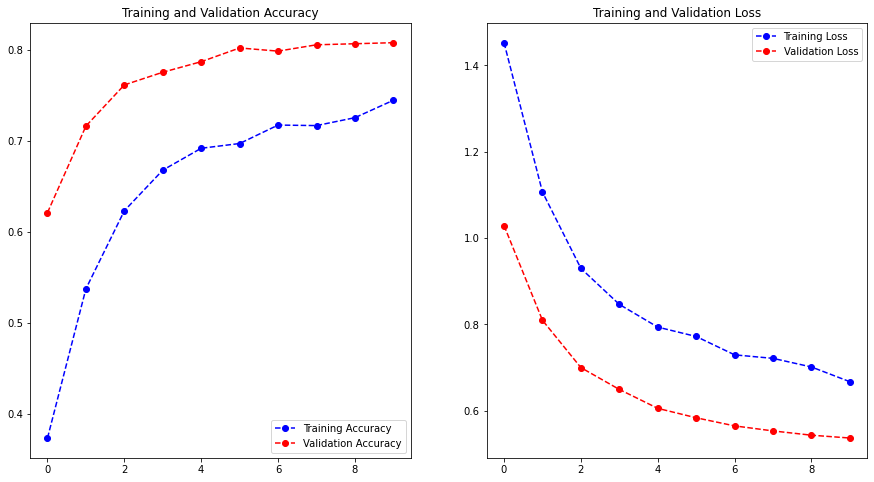

In [30]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(initial_epochs)


plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc,'bo--', label='Training Accuracy')
plt.plot(epochs_range, val_acc, 'ro--', label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, 'bo--', label='Training Loss')
plt.plot(epochs_range, val_loss,'ro--', label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

### Fine Tuning Model 1

In [31]:
base_model.trainable = True

print("Number of layers in the base model: ", len(base_model.layers))

print('Begin fine tuning at 100')
print('========================')
fine_tune_at =  100


for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False
    

base_learning_rate = 0.0001
cnn.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=base_learning_rate/10),
             loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
             metrics=['accuracy'])


initial_epochs = 10
fine_tune_epochs = 10
total_epochs = initial_epochs + fine_tune_epochs

history_fine = cnn.fit(train_set,
                        epochs=total_epochs,
                        initial_epoch=history.epoch[-1],
                        validation_data=val_ds)

Number of layers in the base model:  154
Begin fine tuning at 100
Epoch 10/20
108/108 [==============================] - 98s 871ms/step - loss: 0.6618 - accuracy: 0.7401 - val_loss: 0.5119 - val_accuracy: 0.8134
Epoch 11/20
108/108 [==============================] - 94s 870ms/step - loss: 0.5891 - accuracy: 0.7728 - val_loss: 0.4887 - val_accuracy: 0.8204
Epoch 12/20
108/108 [==============================] - 95s 879ms/step - loss: 0.5582 - accuracy: 0.7832 - val_loss: 0.4902 - val_accuracy: 0.8169
Epoch 13/20
108/108 [==============================] - 95s 884ms/step - loss: 0.5334 - accuracy: 0.7919 - val_loss: 0.4802 - val_accuracy: 0.8123
Epoch 14/20
108/108 [==============================] - 103s 955ms/step - loss: 0.5032 - accuracy: 0.8038 - val_loss: 0.4881 - val_accuracy: 0.8146
Epoch 15/20
108/108 [==============================] - 103s 953ms/step - loss: 0.4840 - accuracy: 0.8159 - val_loss: 0.4786 - val_accuracy: 0.8158
Epoch 16/20
108/108 [==============================] - 1

#### Visualizing Fine-tuned CNN Model

<function matplotlib.pyplot.show(close=None, block=None)>

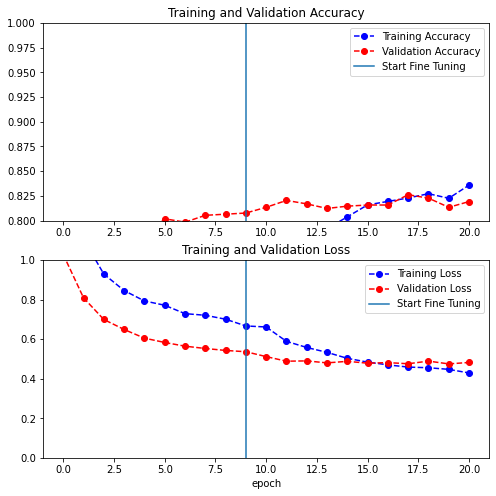

In [32]:
acc += history_fine.history['accuracy']
val_acc += history_fine.history['val_accuracy']

loss += history_fine.history['loss']
val_loss += history_fine.history['val_loss']

plt.figure(figsize=(8,8))
plt.subplot(2,1,1)
plt.plot(acc, 'bo--', label='Training Accuracy')
plt.plot(val_acc,'ro--', label='Validation Accuracy')
plt.ylim([0.8,1])
plt.plot([initial_epochs-1, initial_epochs-1],
        plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='upper right')
plt.title('Training and Validation Accuracy')


plt.subplot(2,1,2)
plt.plot(loss, 'bo--', label='Training Loss')
plt.plot(val_loss,'ro--', label='Validation Loss')
plt.ylim([0, 1.0])
plt.plot([initial_epochs-1, initial_epochs-1],
        plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show





In [30]:
loss, accuracy=cnn.evaluate(val_ds)
print('Test accuracy :', accuracy)

27/27 [==============================] - 18s 654ms/step - loss: 0.4846 - accuracy: 0.8192
Test accuracy : 0.8192352056503296


## Training Model 1 on Average Pooling Convolutional Network

### Pre-trained Data, Average Pooling, Image size 160x160

Found 4318 files belonging to 4 classes.
Using 3455 files for training.
Found 4318 files belonging to 4 classes.
Using 863 files for validation.
['bus', 'motorcycle', 'plane', 'train']
(32, 160, 160, 3)
(32,)
0.0 1.0
Epoch 1/10
108/108 [==============================] - 72s 661ms/step - loss: 1.2610 - accuracy: 0.4521 - val_loss: 1.0768 - val_accuracy: 0.5527
Epoch 2/10
108/108 [==============================] - 64s 588ms/step - loss: 1.0219 - accuracy: 0.5708 - val_loss: 1.0509 - val_accuracy: 0.5620
Epoch 3/10
108/108 [==============================] - 63s 587ms/step - loss: 0.9116 - accuracy: 0.6356 - val_loss: 1.0863 - val_accuracy: 0.5736
Epoch 4/10
108/108 [==============================] - 64s 591ms/step - loss: 0.7462 - accuracy: 0.7080 - val_loss: 1.1364 - val_accuracy: 0.5423
Epoch 5/10
108/108 [==============================] - 62s 575ms/step - loss: 0.5466 - accuracy: 0.8075 - val_loss: 1.2703 - val_accuracy: 0.5620
Epoch 6/10
108/108 [==============================] - 63s 

640.4960749149323

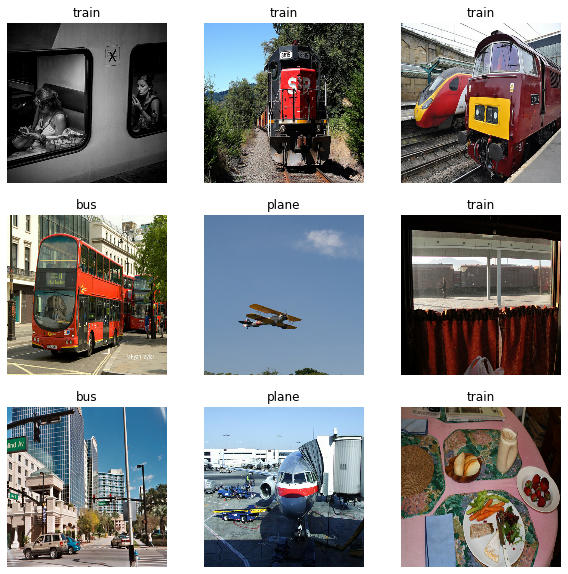

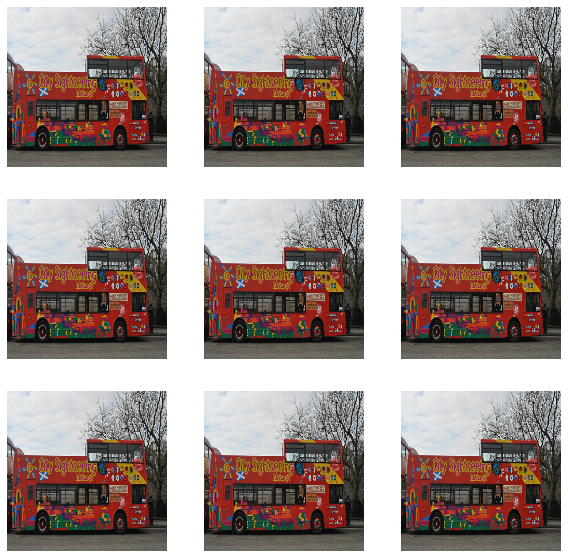

In [33]:
batch_size = 32
img_height = 160
img_width = 160

train_set = tf.keras.preprocessing.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

val_ds = tf.keras.preprocessing.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="validation",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

class_names = train_set.class_names
print(class_names)


plt.figure(figsize=(10, 10))
for images, labels in train_set.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")

for image_batch, labels_batch in train_set:
    print(image_batch.shape)
    print(labels_batch.shape)
    break

    
# Scaling
AUTOTUNE = tf.data.AUTOTUNE

train_set = train_set.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

normalization_layer = layers.experimental.preprocessing.Rescaling(1./255)

normalized_ds = train_set.map(lambda x, y: (normalization_layer(x), y))
image_batch, labels_batch = next(iter(normalized_ds))
first_image = image_batch[0]

print(np.min(first_image), np.max(first_image))

num_classes = 4

#Creating Augmented samples to add to existing data
data_augmentation = tf.keras.Sequential([
  tf.keras.layers.experimental.preprocessing.RandomFlip('horizontal'),    # Data Augumentation
  tf.keras.layers.experimental.preprocessing.RandomRotation(0.2),
])

#Augmentation plot of a sample image
for image, _ in train_set.take(1):
    plt.figure(figsize=(10, 10))
    first_image = image[0]
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        augmented_image = data_augmentation(tf.expand_dims(first_image, 0))
        plt.imshow(augmented_image[0]/255)
        plt.axis('off')



# Convolution
cnn_avpool = Sequential([
  layers.experimental.preprocessing.Rescaling(1./255, input_shape=(160, 160, 3)),
  layers.Conv2D(filters=32, kernel_size=3,activation='relu'), # Convolution
  layers.AveragePooling2D(pool_size=2, strides=2), #pooling
  layers.Conv2D(filters=32, kernel_size=3,activation='relu'), #Second convolution
  layers.AveragePooling2D(pool_size=2, strides=2),
  layers.Dense(128, activation='relu'), #Full connection
  layers.Flatten(), #flattening
  layers.Dense(num_classes, activation = 'sigmoid') #output layer
])
# Compiling
cnn_avpool.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])
# Training
start = time.time()
epochs=10
history = cnn_avpool.fit(
  train_set,
  validation_data=val_ds,
  epochs=epochs
)

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

stop = time.time()
cnnT_ave = (stop-start)
cnnT_ave

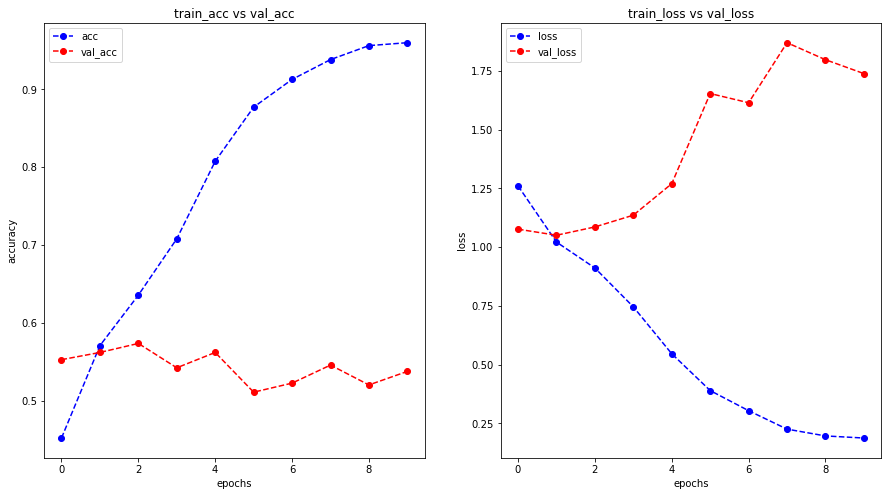

In [34]:
fig = plt.figure(figsize=(15,8))

# Plot accuracy
plt.subplot(1,2,1)
plt.plot(history.history['accuracy'],'bo--', label = "acc")
plt.plot(history.history['val_accuracy'], 'ro--', label = "val_acc")
plt.title("train_acc vs val_acc")
plt.ylabel("accuracy")
plt.xlabel("epochs")
plt.legend()

# Plot loss function
plt.subplot(1,2,2)
plt.plot(history.history['loss'],'bo--', label = "loss")
plt.plot(history.history['val_loss'], 'ro--', label = "val_loss")
plt.title("train_loss vs val_loss")
plt.ylabel("loss")
plt.xlabel("epochs")

plt.legend()
plt.show()

### Pretrain Model with CNN [Average Pooling]

In [35]:
IMG_SIZE =(160,160)
IMG_SHAPE =IMG_SIZE + (3,)
base_model = tf.keras.applications.MobileNetV2(input_shape=IMG_SHAPE,include_top=False,weights='imagenet')
image_batch, labels_batch =next(iter(train_set))
feature_batch = base_model(image_batch)
print(feature_batch.shape)

base_model.trainable = False
global_average_layer=tf.keras.layers.GlobalAveragePooling2D()
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

prediction_layer= tf.keras.layers.Dense(4)
prediction_batch = prediction_layer(feature_batch_average)
print(prediction_batch.shape)

(32, 5, 5, 1280)
(32, 1280)
(32, 4)


In [36]:
preprocess_input = tf.keras.applications.mobilenet_v2.preprocess_input
inputs = tf.keras.Input(shape = (160, 160, 3))
x = data_augmentation(inputs)
x = preprocess_input(x)
x = base_model(x, training = False)
x = global_average_layer(x)
x = tf.keras.layers.Dropout(0.2)(x)
outputs = prediction_layer(x)
cnn_avpool = tf.keras.Model(inputs, outputs)

base_learning_rate = 0.0001
cnn_avpool.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = base_learning_rate),
              loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits = True),
              metrics = ['accuracy'])


len(cnn_avpool.trainable_variables)

initial_epochs = 10

loss0, accuracy0 = cnn_avpool.evaluate(val_ds)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

history = cnn_avpool.fit(train_set,
                    epochs = initial_epochs,
                    validation_data = val_ds)

27/27 [==============================] - 14s 476ms/step - loss: 1.5931 - accuracy: 0.3105
initial loss: 1.59
initial accuracy: 0.31
Epoch 1/10
108/108 [==============================] - 74s 656ms/step - loss: 1.4529 - accuracy: 0.3708 - val_loss: 1.0447 - val_accuracy: 0.5736
Epoch 2/10
108/108 [==============================] - 71s 655ms/step - loss: 1.1002 - accuracy: 0.5450 - val_loss: 0.8143 - val_accuracy: 0.7034
Epoch 3/10
108/108 [==============================] - 71s 660ms/step - loss: 0.9138 - accuracy: 0.6428 - val_loss: 0.7053 - val_accuracy: 0.7613
Epoch 4/10
108/108 [==============================] - 71s 659ms/step - loss: 0.8444 - accuracy: 0.6741 - val_loss: 0.6484 - val_accuracy: 0.7752
Epoch 5/10
108/108 [==============================] - 71s 660ms/step - loss: 0.8084 - accuracy: 0.6828 - val_loss: 0.6096 - val_accuracy: 0.7914
Epoch 6/10
108/108 [==============================] - 71s 656ms/step - loss: 0.7564 - accuracy: 0.7062 - val_loss: 0.5894 - val_accuracy: 0.786

### Visualizing CNN [Average Pooling]

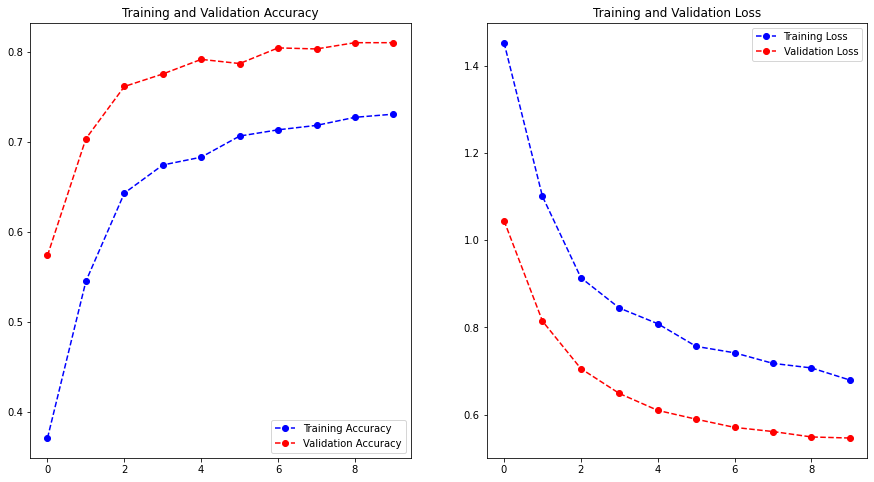

In [37]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(initial_epochs)


plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc,'bo--', label='Training Accuracy')
plt.plot(epochs_range, val_acc, 'ro--', label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, 'bo--', label='Training Loss')
plt.plot(epochs_range, val_loss,'ro--', label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

### Fine Tuning CNN [Average Pooling]

In [38]:
base_model.trainable = True

print("Number of layers in the base model: ", len(base_model.layers))

print('Begin fine tuning at 100')
print('========================')
fine_tune_at =  100


for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False
    

base_learning_rate = 0.0001
cnn_avpool.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=base_learning_rate/10),
             loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
             metrics=['accuracy'])


initial_epochs = 10
fine_tune_epochs = 10
total_epochs = initial_epochs + fine_tune_epochs

history_fine = cnn_avpool.fit(train_set,
                        epochs=total_epochs,
                        initial_epoch=history.epoch[-1],
                        validation_data=val_ds)

Number of layers in the base model:  154
Begin fine tuning at 100
Epoch 10/20
108/108 [==============================] - 107s 955ms/step - loss: 0.6535 - accuracy: 0.7441 - val_loss: 0.5161 - val_accuracy: 0.8100
Epoch 11/20
108/108 [==============================] - 103s 952ms/step - loss: 0.5978 - accuracy: 0.7676 - val_loss: 0.5024 - val_accuracy: 0.8158
Epoch 12/20
108/108 [==============================] - 104s 960ms/step - loss: 0.5597 - accuracy: 0.7821 - val_loss: 0.4968 - val_accuracy: 0.8146
Epoch 13/20
108/108 [==============================] - 102s 942ms/step - loss: 0.5304 - accuracy: 0.7904 - val_loss: 0.4992 - val_accuracy: 0.8192
Epoch 14/20
108/108 [==============================] - 101s 939ms/step - loss: 0.5071 - accuracy: 0.8017 - val_loss: 0.4960 - val_accuracy: 0.8169
Epoch 15/20
108/108 [==============================] - 102s 942ms/step - loss: 0.4941 - accuracy: 0.8084 - val_loss: 0.5013 - val_accuracy: 0.8111
Epoch 16/20
108/108 [==============================]

### Visualizing Fine-Tuned CNN [Average Pooling]

27/27 [==============================] - 13s 496ms/step - loss: 0.5029 - accuracy: 0.8192
Test accuracy : 0.8192352056503296


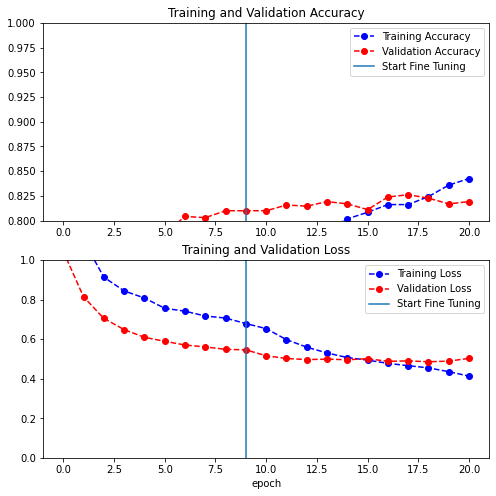

In [39]:
acc += history_fine.history['accuracy']
val_acc += history_fine.history['val_accuracy']

loss += history_fine.history['loss']
val_loss += history_fine.history['val_loss']

plt.figure(figsize=(8,8))
plt.subplot(2,1,1)
plt.plot(acc, 'bo--', label='Training Accuracy')
plt.plot(val_acc,'ro--', label='Validation Accuracy')
plt.ylim([0.8,1])
plt.plot([initial_epochs-1, initial_epochs-1],
        plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='upper right')
plt.title('Training and Validation Accuracy')


plt.subplot(2,1,2)
plt.plot(loss, 'bo--', label='Training Loss')
plt.plot(val_loss,'ro--', label='Validation Loss')
plt.ylim([0, 1.0])
plt.plot([initial_epochs-1, initial_epochs-1],
        plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show

loss, accuracy=cnn_avpool.evaluate(val_ds)
print('Test accuracy :', accuracy)

# Deeper Network
## Model 2
* Activation function: relu, relu, relu, sigmoid, sigmoid(Output layer)
* padding: same
* Pooling: (2,2)
* Epoch: 15
* filter: 32,32,64,128
* filter size: (3,3)
* Batch Size: 32
* strides: (2,2)
* Image Size: 160x160
* Optimizer: RMSrop
* loss function: SparseCategoricalCrossentropy

Found 4318 files belonging to 4 classes.
Using 3455 files for training.
Found 4318 files belonging to 4 classes.
Using 863 files for validation.
['bus', 'motorcycle', 'plane', 'train']
(32, 160, 160, 3)
(32,)
0.04889706 0.91859686
Epoch 1/15
108/108 [==============================] - 127s 1s/step - loss: 3.1581 - accuracy: 0.3198 - val_loss: 1.3588 - val_accuracy: 0.3326
Epoch 2/15
108/108 [==============================] - 121s 1s/step - loss: 1.3442 - accuracy: 0.3531 - val_loss: 1.3419 - val_accuracy: 0.3638
Epoch 3/15
108/108 [==============================] - 122s 1s/step - loss: 1.3154 - accuracy: 0.3748 - val_loss: 1.3319 - val_accuracy: 0.4299
Epoch 4/15
108/108 [==============================] - 120s 1s/step - loss: 1.3003 - accuracy: 0.4041 - val_loss: 1.3138 - val_accuracy: 0.4229
Epoch 5/15
108/108 [==============================] - 120s 1s/step - loss: 1.2727 - accuracy: 0.4255 - val_loss: 1.3431 - val_accuracy: 0.4229
Epoch 6/15
108/108 [==============================] - 

1976.9327280521393

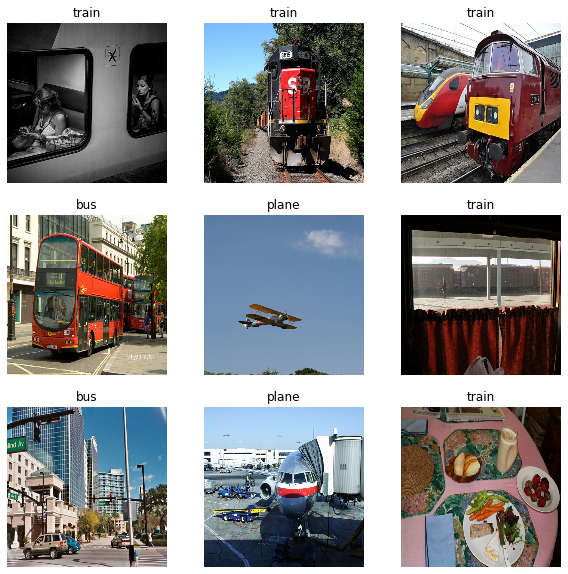

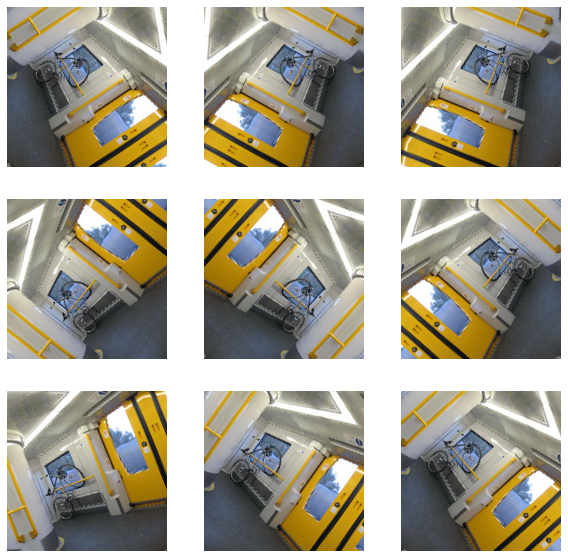

In [41]:
batch_size = 32
img_height = 160
img_width = 160

train_set = tf.keras.preprocessing.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

val_ds = tf.keras.preprocessing.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="validation",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

class_names = train_set.class_names
print(class_names)


plt.figure(figsize=(10, 10))
for images, labels in train_set.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")

for image_batch, labels_batch in train_set:
    print(image_batch.shape)
    print(labels_batch.shape)
    break

    
# Scaling
AUTOTUNE = tf.data.AUTOTUNE

train_set = train_set.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

normalization_layer = layers.experimental.preprocessing.Rescaling(1./255)

normalized_ds = train_set.map(lambda x, y: (normalization_layer(x), y))
image_batch, labels_batch = next(iter(normalized_ds))
first_image = image_batch[0]

print(np.min(first_image), np.max(first_image))

num_classes = 4

#Creating Augmented samples to add to existing data
data_augmentation = tf.keras.Sequential([
  tf.keras.layers.experimental.preprocessing.RandomFlip('horizontal'),    # Data Augumentation
  tf.keras.layers.experimental.preprocessing.RandomRotation(0.2),
])

#Augmentation plot of a sample image
for image, _ in train_set.take(1):
    plt.figure(figsize=(10, 10))
    first_image = image[0]
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        augmented_image = data_augmentation(tf.expand_dims(first_image, 0))
        plt.imshow(augmented_image[0]/255)
        plt.axis('off')



# Convolution
cnn_2 = Sequential([
  layers.experimental.preprocessing.Rescaling(1./255, input_shape=(160, 160, 3)),
  layers.Conv2D(filters=32, kernel_size=3,activation='relu'), # Convolution
  layers.MaxPooling2D(pool_size=2, strides=2), #pooling
  layers.Conv2D(filters=32, kernel_size=3,activation='relu'), #Second convolution
  layers.MaxPooling2D(pool_size=2, strides=2),
  layers.Conv2D(filters=64, kernel_size=3,activation='relu'), #Third convolution
  layers.MaxPooling2D(pool_size=2, strides=2),
  layers.Dense(128, activation='sigmoid'), #Full connection
  layers.Flatten(), #flattening
  layers.Dense(num_classes, activation = 'sigmoid') #output layer
])
# Compiling
cnn_2.compile(optimizer='RMSprop',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])
# Training
start = time.time()
epochs=15
history = cnn_2.fit(
  train_set,
  validation_data=val_ds,
  epochs=epochs
)

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

stop = time.time()
cnnT_2 = (stop-start)
cnnT_2

### Visualizing CNN Model 2

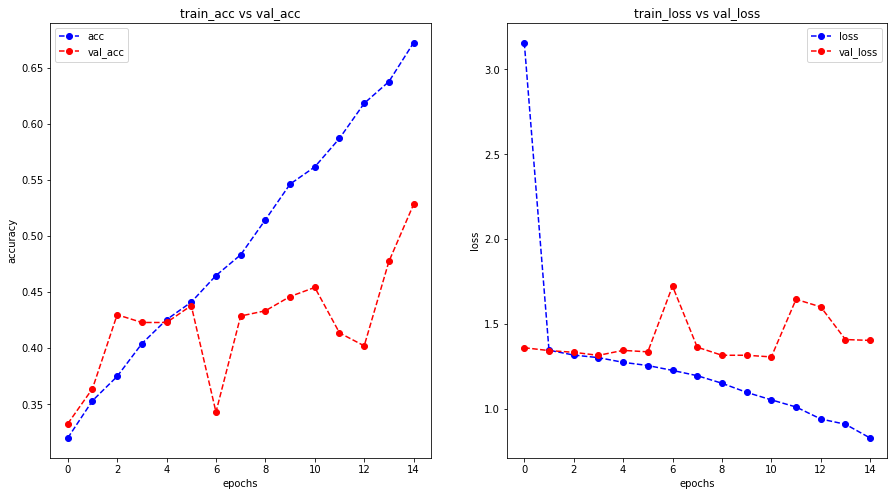

In [42]:
fig = plt.figure(figsize=(15,8))

# Plot accuracy
plt.subplot(1,2,1)
plt.plot(history.history['accuracy'],'bo--', label = "acc")
plt.plot(history.history['val_accuracy'], 'ro--', label = "val_acc")
plt.title("train_acc vs val_acc")
plt.ylabel("accuracy")
plt.xlabel("epochs")
plt.legend()

# Plot loss function
plt.subplot(1,2,2)
plt.plot(history.history['loss'],'bo--', label = "loss")
plt.plot(history.history['val_loss'], 'ro--', label = "val_loss")
plt.title("train_loss vs val_loss")
plt.ylabel("loss")
plt.xlabel("epochs")

plt.legend()
plt.show()

### Pre-train base Model with CNN Model 2

In [43]:
IMG_SIZE =(160,160)
IMG_SHAPE =IMG_SIZE + (3,)
base_model = tf.keras.applications.MobileNetV2(input_shape=IMG_SHAPE,include_top=False,weights='imagenet')
image_batch, labels_batch =next(iter(train_set))
feature_batch = base_model(image_batch)
print(feature_batch.shape)

base_model.trainable = False
global_average_layer=tf.keras.layers.GlobalAveragePooling2D()
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

prediction_layer= tf.keras.layers.Dense(4)
prediction_batch = prediction_layer(feature_batch_average)
print(prediction_batch.shape)

(32, 5, 5, 1280)
(32, 1280)
(32, 4)


In [44]:
preprocess_input = tf.keras.applications.mobilenet_v2.preprocess_input
inputs = tf.keras.Input(shape = (160, 160, 3))
x = data_augmentation(inputs)
x = preprocess_input(x)
x = base_model(x, training = False)
x = global_average_layer(x)
x = tf.keras.layers.Dropout(0.2)(x)
outputs = prediction_layer(x)
cnn_2 = tf.keras.Model(inputs, outputs)

base_learning_rate = 0.0001
cnn_2.compile(optimizer = tf.keras.optimizers.RMSprop(learning_rate = base_learning_rate),
              loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits = True),
              metrics = ['accuracy'])


len(cnn_2.trainable_variables)

initial_epochs = 15

loss0, accuracy0 = cnn_2.evaluate(val_ds)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

history = cnn_2.fit(train_set,
                    epochs = initial_epochs,
                    validation_data = val_ds)

27/27 [==============================] - 23s 773ms/step - loss: 1.6948 - accuracy: 0.3604
initial loss: 1.69
initial accuracy: 0.36
Epoch 1/15
108/108 [==============================] - 119s 1s/step - loss: 1.5502 - accuracy: 0.3679 - val_loss: 1.1151 - val_accuracy: 0.5458
Epoch 2/15
108/108 [==============================] - 122s 1s/step - loss: 1.1301 - accuracy: 0.5291 - val_loss: 0.8544 - val_accuracy: 0.6883
Epoch 3/15
108/108 [==============================] - 128s 1s/step - loss: 0.9327 - accuracy: 0.6298 - val_loss: 0.7229 - val_accuracy: 0.7416
Epoch 4/15
108/108 [==============================] - 97s 902ms/step - loss: 0.8403 - accuracy: 0.6671 - val_loss: 0.6433 - val_accuracy: 0.7671
Epoch 5/15
108/108 [==============================] - 110s 1s/step - loss: 0.7824 - accuracy: 0.6978 - val_loss: 0.6117 - val_accuracy: 0.7706
Epoch 6/15
108/108 [==============================] - 113s 1s/step - loss: 0.7302 - accuracy: 0.7149 - val_loss: 0.5877 - val_accuracy: 0.7810
Epoch 7/

### Visualizing Model 2(with Pre-trained data)

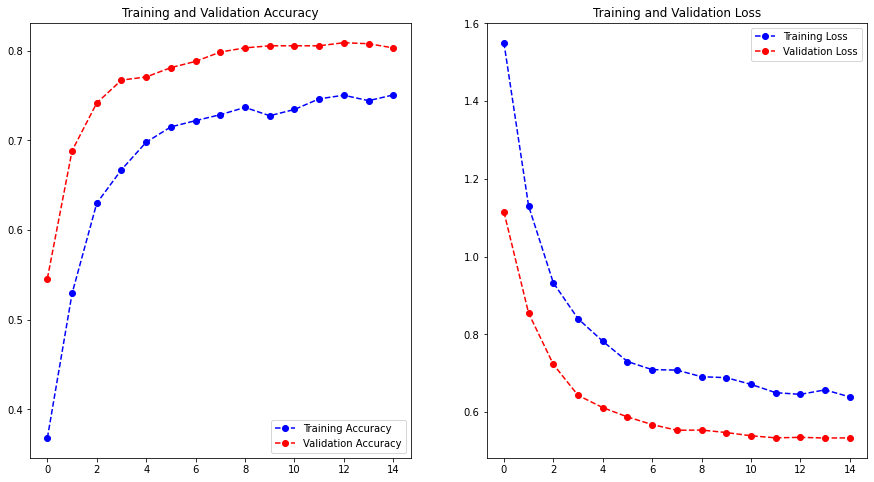

In [45]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(initial_epochs)


plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc,'bo--', label='Training Accuracy')
plt.plot(epochs_range, val_acc, 'ro--', label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, 'bo--', label='Training Loss')
plt.plot(epochs_range, val_loss,'ro--', label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

### Fine Tuning CNN Model 2

In [46]:
base_model.trainable = True

print("Number of layers in the base model: ", len(base_model.layers))

print('Begin fine tuning at 100')
print('========================')
fine_tune_at =  100


for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False
    

base_learning_rate = 0.0001
cnn_2.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=base_learning_rate/10),
             loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
             metrics=['accuracy'])


initial_epochs = 15
fine_tune_epochs = 15
total_epochs = initial_epochs + fine_tune_epochs

history_fine = cnn_2.fit(train_set,
                        epochs=total_epochs,
                        initial_epoch=history.epoch[-1],
                        validation_data=val_ds)

Number of layers in the base model:  154
Begin fine tuning at 100
Epoch 15/30
108/108 [==============================] - 212s 2s/step - loss: 0.6135 - accuracy: 0.7632 - val_loss: 0.5245 - val_accuracy: 0.8053
Epoch 16/30
108/108 [==============================] - 167s 2s/step - loss: 0.5696 - accuracy: 0.7760 - val_loss: 0.5118 - val_accuracy: 0.8192
Epoch 17/30
108/108 [==============================] - 174s 2s/step - loss: 0.5443 - accuracy: 0.7957 - val_loss: 0.5181 - val_accuracy: 0.8111
Epoch 18/30
108/108 [==============================] - 173s 2s/step - loss: 0.5287 - accuracy: 0.7971 - val_loss: 0.5303 - val_accuracy: 0.8111
Epoch 19/30
108/108 [==============================] - 167s 2s/step - loss: 0.5144 - accuracy: 0.7994 - val_loss: 0.5117 - val_accuracy: 0.8088
Epoch 20/30
108/108 [==============================] - 146s 1s/step - loss: 0.4800 - accuracy: 0.8113 - val_loss: 0.5034 - val_accuracy: 0.8181
Epoch 21/30
108/108 [==============================] - 151s 1s/step - 

### Visualizing Fine Tuned Model 2

27/27 [==============================] - 39s 1s/step - loss: 0.5061 - accuracy: 0.8262
Test accuracy : 0.8261877298355103


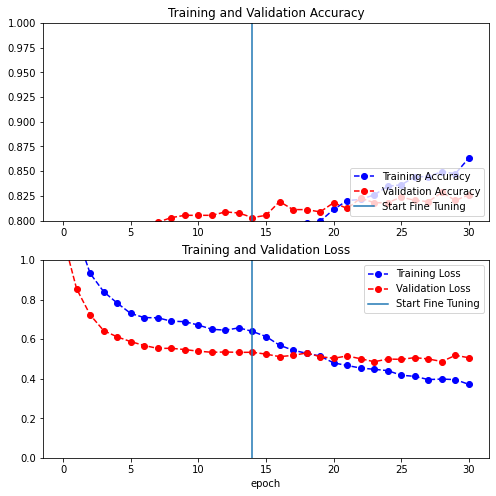

In [47]:
acc += history_fine.history['accuracy']
val_acc += history_fine.history['val_accuracy']

loss += history_fine.history['loss']
val_loss += history_fine.history['val_loss']

plt.figure(figsize=(8,8))
plt.subplot(2,1,1)
plt.plot(acc, 'bo--', label='Training Accuracy')
plt.plot(val_acc,'ro--', label='Validation Accuracy')
plt.ylim([0.8,1])
plt.plot([initial_epochs-1, initial_epochs-1],
        plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')


plt.subplot(2,1,2)
plt.plot(loss, 'bo--', label='Training Loss')
plt.plot(val_loss,'ro--', label='Validation Loss')
plt.ylim([0, 1.0])
plt.plot([initial_epochs-1, initial_epochs-1],
        plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show

loss, accuracy=cnn_2.evaluate(val_ds)
print('Test accuracy :', accuracy)

# Deeper Network
## Model 3
* Activation function: relu, relu, relu, relu, sigmoid(Output layer)
* padding: Default
* Pooling: (2,2)
* Epoch: 15
* filter: 32,32, 32,128
* filter size: (3,3)
* Batch Size: 32
* strides: (2,2)
* Image Size: 160x160
* Optimizer: SGD
* loss function: SparseCategoricalCrossentropy

* The model trained faster with RMSprop as the optimization but did not performed well in training and on the test set
* This model shows that a deeper network does not generally mean improved performance. 

Found 4318 files belonging to 4 classes.
Using 3455 files for training.
Found 4318 files belonging to 4 classes.
Using 863 files for validation.
['bus', 'motorcycle', 'plane', 'train']
(32, 160, 160, 3)
(32,)
0.0 1.0
Epoch 1/15
108/108 [==============================] - 150s 1s/step - loss: 1.3451 - accuracy: 0.3389 - val_loss: 1.2762 - val_accuracy: 0.3998
Epoch 2/15
108/108 [==============================] - 104s 962ms/step - loss: 1.2421 - accuracy: 0.4333 - val_loss: 1.2403 - val_accuracy: 0.4681
Epoch 3/15
108/108 [==============================] - 106s 986ms/step - loss: 1.1668 - accuracy: 0.4828 - val_loss: 1.2886 - val_accuracy: 0.3754
Epoch 4/15
108/108 [==============================] - 128s 1s/step - loss: 1.1187 - accuracy: 0.5230 - val_loss: 1.0933 - val_accuracy: 0.5469
Epoch 5/15
108/108 [==============================] - 106s 986ms/step - loss: 1.0755 - accuracy: 0.5433 - val_loss: 1.0554 - val_accuracy: 0.5643
Epoch 6/15
108/108 [==============================] - 103s 

1739.9304411411285

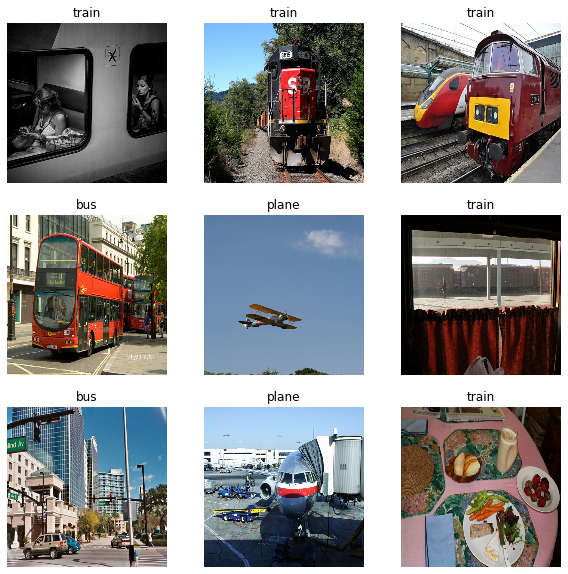

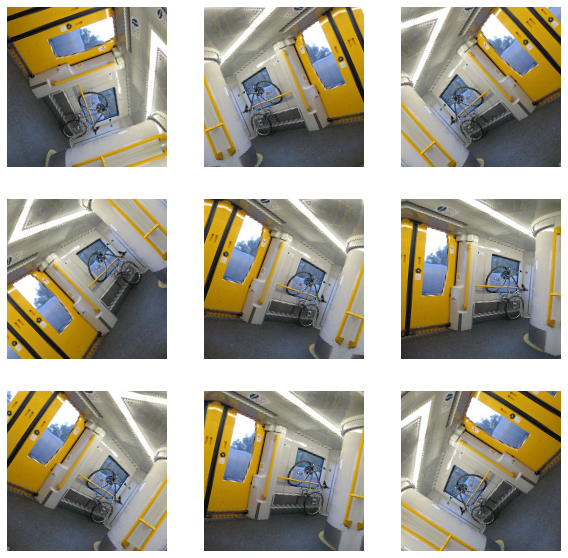

In [49]:
batch_size = 32
img_height = 160
img_width = 160

train_set = tf.keras.preprocessing.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

val_ds = tf.keras.preprocessing.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="validation",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

class_names = train_set.class_names
print(class_names)


plt.figure(figsize=(10, 10))
for images, labels in train_set.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")

for image_batch, labels_batch in train_set:
    print(image_batch.shape)
    print(labels_batch.shape)
    break

    
# Scaling
AUTOTUNE = tf.data.AUTOTUNE

train_set = train_set.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

normalization_layer = layers.experimental.preprocessing.Rescaling(1./255)

normalized_ds = train_set.map(lambda x, y: (normalization_layer(x), y))
image_batch, labels_batch = next(iter(normalized_ds))
first_image = image_batch[0]

print(np.min(first_image), np.max(first_image))

num_classes = 4

#Creating Augmented samples to add to existing data
data_augmentation = tf.keras.Sequential([
  tf.keras.layers.experimental.preprocessing.RandomFlip('horizontal'),    # Data Augumentation
  tf.keras.layers.experimental.preprocessing.RandomRotation(0.2),
])

#Augmentation plot of a sample image
for image, _ in train_set.take(1):
    plt.figure(figsize=(10, 10))
    first_image = image[0]
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        augmented_image = data_augmentation(tf.expand_dims(first_image, 0))
        plt.imshow(augmented_image[0]/255)
        plt.axis('off')



# Convolution
cnn_3 = Sequential([
  layers.experimental.preprocessing.Rescaling(1./255, input_shape=(160, 160, 3)),
  layers.Conv2D(filters=32, kernel_size=3,activation='relu'), # Convolution
  layers.MaxPooling2D(pool_size=2, strides=2), #pooling
  layers.Conv2D(filters=32, kernel_size=3,activation='relu'), #Second convolution
  layers.MaxPooling2D(pool_size=2, strides=2),
  layers.Conv2D(filters=32, kernel_size=3,activation='relu'), #Third convolution
  layers.MaxPooling2D(pool_size=2, strides=2),
  layers.Dense(128, activation='relu'), #Full connection
  layers.Flatten(), #flattening
  layers.Dense(num_classes, activation = 'sigmoid') #output layer
])
# Compiling
cnn_3.compile(optimizer='SGD',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])
# Training
start = time.time()
epochs=15
history = cnn_3.fit(
  train_set,
  validation_data=val_ds,
  epochs=epochs
)

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

stop = time.time()
cnnT_3 = (stop-start)
cnnT_3

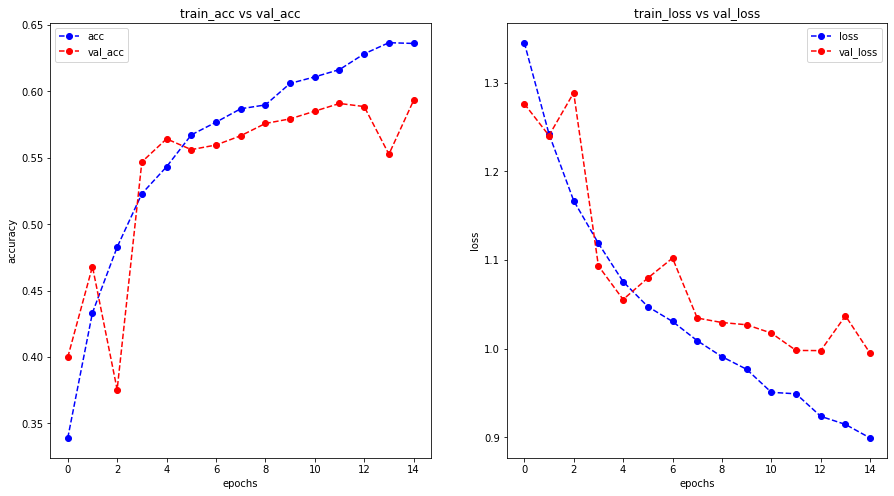

In [50]:
fig = plt.figure(figsize=(15,8))

# Plot accuracy
plt.subplot(1,2,1)
plt.plot(history.history['accuracy'],'bo--', label = "acc")
plt.plot(history.history['val_accuracy'], 'ro--', label = "val_acc")
plt.title("train_acc vs val_acc")
plt.ylabel("accuracy")
plt.xlabel("epochs")
plt.legend()

# Plot loss function
plt.subplot(1,2,2)
plt.plot(history.history['loss'],'bo--', label = "loss")
plt.plot(history.history['val_loss'], 'ro--', label = "val_loss")
plt.title("train_loss vs val_loss")
plt.ylabel("loss")
plt.xlabel("epochs")

plt.legend()
plt.show()

In [51]:
IMG_SIZE =(160,160)
IMG_SHAPE =IMG_SIZE + (3,)
base_model = tf.keras.applications.MobileNetV2(input_shape=IMG_SHAPE,include_top=False,weights='imagenet')
image_batch, labels_batch =next(iter(train_set))
feature_batch = base_model(image_batch)
print(feature_batch.shape)

base_model.trainable = False
global_average_layer=tf.keras.layers.GlobalAveragePooling2D()
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

prediction_layer= tf.keras.layers.Dense(4)
prediction_batch = prediction_layer(feature_batch_average)
print(prediction_batch.shape)

(32, 5, 5, 1280)
(32, 1280)
(32, 4)


In [52]:
preprocess_input = tf.keras.applications.mobilenet_v2.preprocess_input
inputs = tf.keras.Input(shape = (160, 160, 3))
x = data_augmentation(inputs)
x = preprocess_input(x)
x = base_model(x, training = False)
x = global_average_layer(x)
x = tf.keras.layers.Dropout(0.2)(x)
outputs = prediction_layer(x)
cnn_3 = tf.keras.Model(inputs, outputs)

base_learning_rate = 0.0001
cnn_3.compile(optimizer = tf.keras.optimizers.SGD(learning_rate = base_learning_rate),
              loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits = True),
              metrics = ['accuracy'])


len(cnn_3.trainable_variables)

initial_epochs = 15

loss0, accuracy0 = cnn_3.evaluate(val_ds)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

history = cnn_3.fit(train_set,
                    epochs = initial_epochs,
                    validation_data = val_ds)

27/27 [==============================] - 22s 678ms/step - loss: 1.6886 - accuracy: 0.2584
initial loss: 1.69
initial accuracy: 0.26
Epoch 1/15
108/108 [==============================] - 136s 982ms/step - loss: 1.7944 - accuracy: 0.2527 - val_loss: 1.5469 - val_accuracy: 0.3059
Epoch 2/15
108/108 [==============================] - 108s 1s/step - loss: 1.6945 - accuracy: 0.2802 - val_loss: 1.4641 - val_accuracy: 0.3384
Epoch 3/15
108/108 [==============================] - 97s 903ms/step - loss: 1.6170 - accuracy: 0.3085 - val_loss: 1.3982 - val_accuracy: 0.3731
Epoch 4/15
108/108 [==============================] - 109s 1s/step - loss: 1.5526 - accuracy: 0.3352 - val_loss: 1.3425 - val_accuracy: 0.4090
Epoch 5/15
108/108 [==============================] - 105s 975ms/step - loss: 1.5074 - accuracy: 0.3572 - val_loss: 1.2889 - val_accuracy: 0.4438
Epoch 6/15
108/108 [==============================] - 98s 909ms/step - loss: 1.4688 - accuracy: 0.3754 - val_loss: 1.2441 - val_accuracy: 0.4762


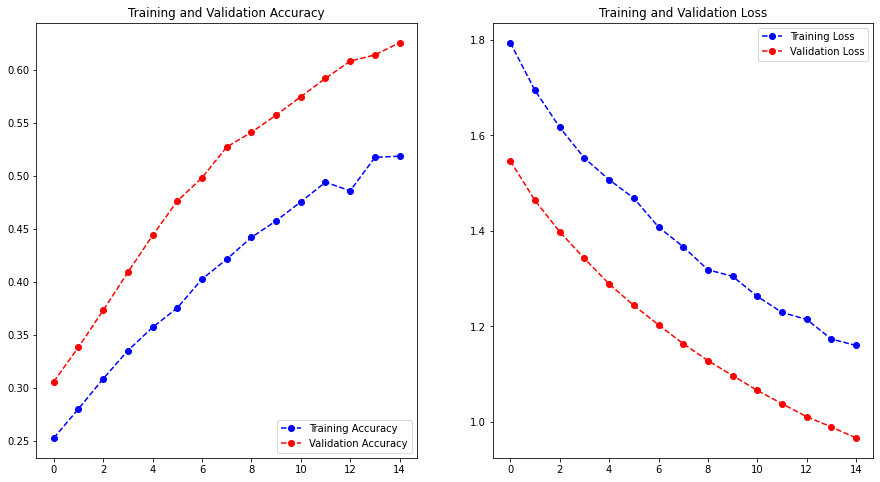

In [53]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(initial_epochs)


plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc,'bo--', label='Training Accuracy')
plt.plot(epochs_range, val_acc, 'ro--', label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, 'bo--', label='Training Loss')
plt.plot(epochs_range, val_loss,'ro--', label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

### Fine tuning Model 3

In [54]:
base_model.trainable = True

print("Number of layers in the base model: ", len(base_model.layers))

print('Begin fine tuning at 100')
print('========================')
fine_tune_at =  100


for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False
    

base_learning_rate = 0.0001
cnn_3.compile(optimizer=tf.keras.optimizers.SGD(learning_rate=base_learning_rate/10),
             loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
             metrics=['accuracy'])


initial_epochs = 15
fine_tune_epochs = 15
total_epochs = initial_epochs + fine_tune_epochs

history_fine = cnn_3.fit(train_set,
                        epochs=total_epochs,
                        initial_epoch=history.epoch[-1],
                        validation_data=val_ds)

Number of layers in the base model:  154
Begin fine tuning at 100
Epoch 15/30
108/108 [==============================] - 163s 1s/step - loss: 1.1058 - accuracy: 0.5427 - val_loss: 0.8966 - val_accuracy: 0.6709
Epoch 16/30
108/108 [==============================] - 174s 2s/step - loss: 1.0246 - accuracy: 0.5864 - val_loss: 0.8495 - val_accuracy: 0.6906
Epoch 17/30
108/108 [==============================] - 161s 1s/step - loss: 0.9577 - accuracy: 0.6104 - val_loss: 0.8056 - val_accuracy: 0.7092
Epoch 18/30
108/108 [==============================] - 146s 1s/step - loss: 0.9307 - accuracy: 0.6252 - val_loss: 0.7750 - val_accuracy: 0.7231
Epoch 19/30
108/108 [==============================] - 155s 1s/step - loss: 0.8993 - accuracy: 0.6495 - val_loss: 0.7516 - val_accuracy: 0.7381
Epoch 20/30
108/108 [==============================] - 183s 2s/step - loss: 0.8758 - accuracy: 0.6544 - val_loss: 0.7313 - val_accuracy: 0.7404
Epoch 21/30
108/108 [==============================] - 165s 2s/step - 

### Visualizing Fine Tuned Model 3

27/27 [==============================] - 17s 620ms/step - loss: 0.6275 - accuracy: 0.7671
Test accuracy : 0.7670915126800537


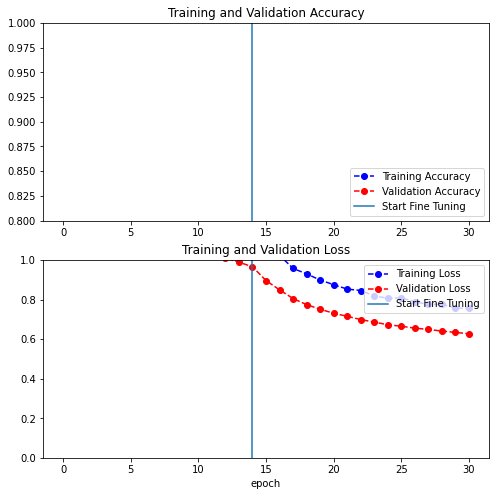

In [55]:
acc += history_fine.history['accuracy']
val_acc += history_fine.history['val_accuracy']

loss += history_fine.history['loss']
val_loss += history_fine.history['val_loss']

plt.figure(figsize=(8,8))
plt.subplot(2,1,1)
plt.plot(acc, 'bo--', label='Training Accuracy')
plt.plot(val_acc,'ro--', label='Validation Accuracy')
plt.ylim([0.8,1])
plt.plot([initial_epochs-1, initial_epochs-1],
        plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')


plt.subplot(2,1,2)
plt.plot(loss, 'bo--', label='Training Loss')
plt.plot(val_loss,'ro--', label='Validation Loss')
plt.ylim([0, 1.0])
plt.plot([initial_epochs-1, initial_epochs-1],
        plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show

loss, accuracy=cnn_3.evaluate(val_ds)
print('Test accuracy :', accuracy)

### Making a prediction with a New Test Data

Found 20 files belonging to 4 classes.
['Bus', 'Motocycle', 'Plane', 'Train']
(20, 160, 160, 3)
(20,)
1/1 [==============================] - 0s 476ms/step - loss: 0.7864 - accuracy: 0.7500
0.7863651514053345 0.75


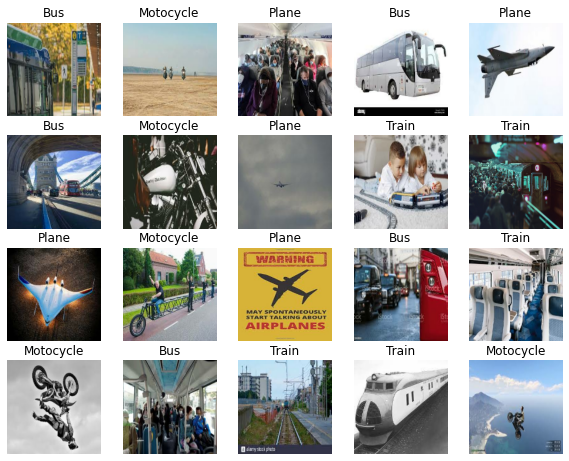

In [40]:
directory = './test_images'
test_data = tf.keras.preprocessing.image_dataset_from_directory(
  directory,
  image_size=(160, 160),
  batch_size=32)

class_names = test_data.class_names
print(class_names)


plt.figure(figsize=(10, 10))
for images, labels in test_data.take(1):
    for i in range(20):
        ax = plt.subplot(5, 5, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")

for image_batch, labels_batch in test_data:
    print(image_batch.shape)
    print(labels_batch.shape)
    break
    
newx_test, newy_test = test_data.as_numpy_iterator().next()

test_loss, test_acc = cnn.evaluate(newx_test, newy_test)
print(test_loss, test_acc)

Found 20 files belonging to 4 classes.
Using 16 files for training.
Found 20 files belonging to 4 classes.
Using 4 files for validation.
['Bus', 'Motocycle', 'Plane', 'Train']
(16, 160, 160, 3)
(16,)
(16, 5, 5, 1280)
(16, 1280)
(16, 4)
1/1 [==============================] - 2s 2s/step - loss: 1.7080 - accuracy: 0.5000
initial loss: 1.71
initial accuracy: 0.50
Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 1.8537 - accuracy: 0.3125 - val_loss: 1.6954 - val_accuracy: 0.5000
Epoch 2/10
1/1 [==============================] - 0s 437ms/step - loss: 1.6707 - accuracy: 0.3125 - val_loss: 1.6816 - val_accuracy: 0.5000
Epoch 3/10
1/1 [==============================] - 0s 421ms/step - loss: 1.4098 - accuracy: 0.4375 - val_loss: 1.6691 - val_accuracy: 0.5000
Epoch 4/10
1/1 [==============================] - 0s 447ms/step - loss: 1.8834 - accuracy: 0.2500 - val_loss: 1.6579 - val_accuracy: 0.5000
Epoch 5/10
1/1 [==============================] - 0s 401ms/step - loss: 1.5513 - 

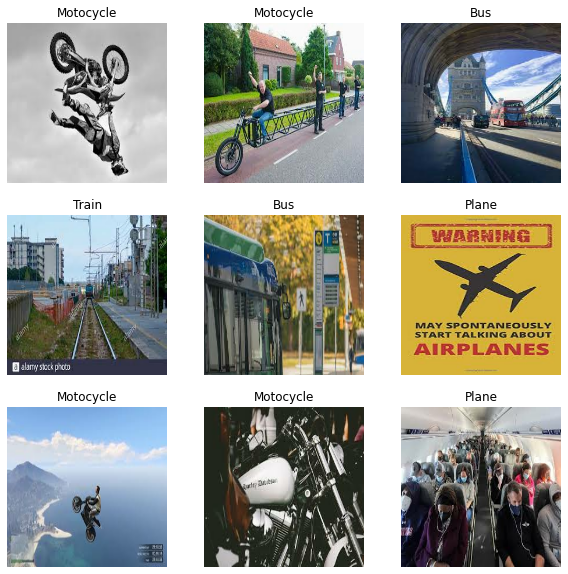

In [41]:
batch_size = 32
img_height = 160
img_width = 160

train_set = tf.keras.preprocessing.image_dataset_from_directory(
  directory,
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

val_ds = tf.keras.preprocessing.image_dataset_from_directory(
  directory,
  validation_split=0.2,
  subset="validation",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

class_names = train_set.class_names
print(class_names)


plt.figure(figsize=(10, 10))
for images, labels in train_set.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")

for image_batch, labels_batch in train_set:
    print(image_batch.shape)
    print(labels_batch.shape)
    break

    
num_classes = 4

#Creating Augmented samples to add to existing data
data_augmentation = tf.keras.Sequential([
  tf.keras.layers.experimental.preprocessing.RandomFlip('horizontal'),    # Data Augumentation
  tf.keras.layers.experimental.preprocessing.RandomRotation(0.2),
])





#pre-trained Model
IMG_SIZE =(160,160)
IMG_SHAPE =IMG_SIZE + (3,)
base_model = tf.keras.applications.MobileNetV2(input_shape=IMG_SHAPE,include_top=False,weights='imagenet')
image_batch, labels_batch =next(iter(train_set))
feature_batch = base_model(image_batch)
print(feature_batch.shape)

base_model.trainable = False
global_average_layer=tf.keras.layers.GlobalAveragePooling2D()
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

prediction_layer= tf.keras.layers.Dense(4)
prediction_batch = prediction_layer(feature_batch_average)
print(prediction_batch.shape)

preprocess_input = tf.keras.applications.mobilenet_v2.preprocess_input
inputs = tf.keras.Input(shape = (160, 160, 3))
x = data_augmentation(inputs)
x = preprocess_input(x)
x = base_model(x, training = False)
x = global_average_layer(x)
x = tf.keras.layers.Dropout(0.2)(x)
outputs = prediction_layer(x)
cnn = tf.keras.Model(inputs, outputs)

base_learning_rate = 0.0001
cnn.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = base_learning_rate),
              loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits = True),
              metrics = ['accuracy'])


len(cnn.trainable_variables)

initial_epochs = 10

loss0, accuracy0 = cnn.evaluate(val_ds)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

history = cnn.fit(train_set,
                    epochs = initial_epochs,
                    validation_data = val_ds)

### Fine Tuning New Test Data

In [42]:
base_model.trainable = True

print("Number of layers in the base model: ", len(base_model.layers))

print('Begin fine tuning at 100')
print('========================')
fine_tune_at =  100


for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False
    

base_learning_rate = 0.0001
cnn.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=base_learning_rate/10),
             loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
             metrics=['accuracy'])


initial_epochs = 10
fine_tune_epochs = 10
total_epochs = initial_epochs + fine_tune_epochs

history_fine = cnn.fit(train_set,
                        epochs=total_epochs,
                        initial_epoch=history.epoch[-1],
                        validation_data=val_ds)

Number of layers in the base model:  154
Begin fine tuning at 100
Epoch 10/20
1/1 [==============================] - 6s 6s/step - loss: 1.3358 - accuracy: 0.3750 - val_loss: 1.5579 - val_accuracy: 0.5000
Epoch 11/20
1/1 [==============================] - 1s 543ms/step - loss: 1.4671 - accuracy: 0.3750 - val_loss: 1.5113 - val_accuracy: 0.5000
Epoch 12/20
1/1 [==============================] - 1s 594ms/step - loss: 1.1432 - accuracy: 0.6875 - val_loss: 1.4733 - val_accuracy: 0.5000
Epoch 13/20
1/1 [==============================] - 1s 538ms/step - loss: 1.3599 - accuracy: 0.4375 - val_loss: 1.4454 - val_accuracy: 0.5000
Epoch 14/20
1/1 [==============================] - 1s 591ms/step - loss: 1.2149 - accuracy: 0.5625 - val_loss: 1.4162 - val_accuracy: 0.5000
Epoch 15/20
1/1 [==============================] - 1s 567ms/step - loss: 0.8474 - accuracy: 0.6250 - val_loss: 1.3950 - val_accuracy: 0.5000
Epoch 16/20
1/1 [==============================] - 1s 565ms/step - loss: 1.1050 - accuracy:

### Extras Challenge

### Explainability Methods

#### SmoothGRAD

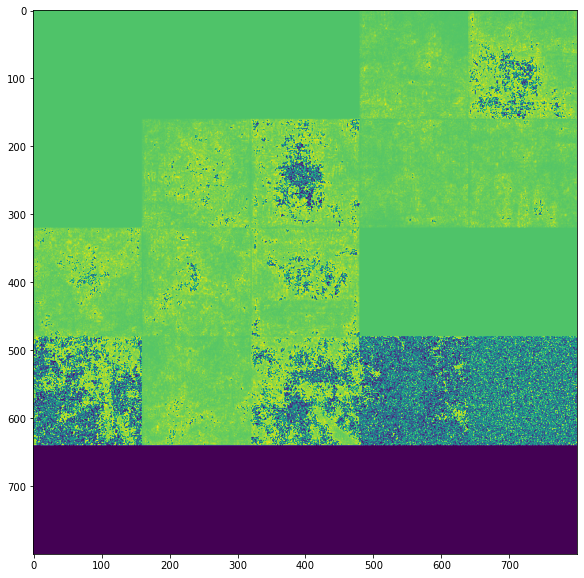

In [53]:
data = (newx_test, None)
explainer = SmoothGrad()
grid = explainer.explain(
    data,
    cnn,
    0,
    20,
    1.0,
)


tf.summary.image("SmoothGrad", np.expand_dims([grid], axis=-1), step=1)
plt.figure(figsize=(12,10))
plt.imshow(grid.astype("uint8"))
plt.show()

#### Integrated Gradients

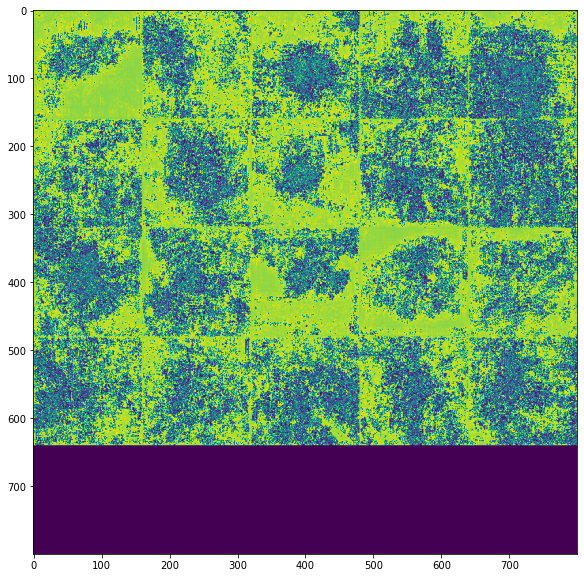

In [44]:
data = (newx_test, None)
explainer = IntegratedGradients()
grid = explainer.explain(data, cnn, 0, n_steps=20)  
plt.figure(figsize=(12,10))
plt.imshow(grid.astype("uint8"))
plt.show()

#### Occlusion Sensitivity

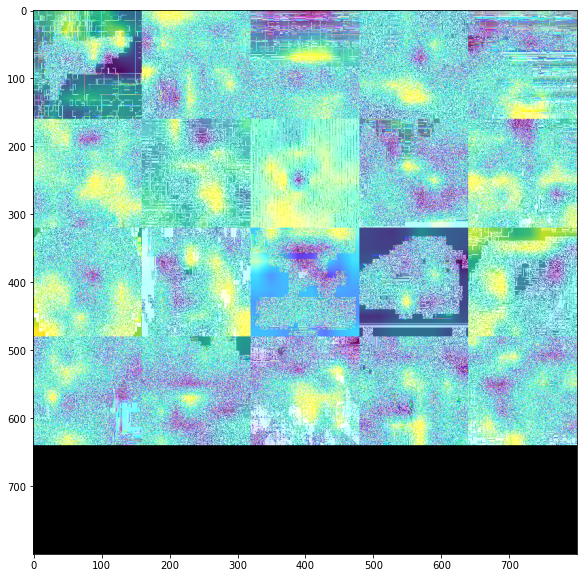

In [55]:
data = (newx_test, None)
explainer = OcclusionSensitivity()
grid = explainer.explain(data, cnn, 0, 20)
plt.figure(figsize=(12,10))
plt.imshow(grid.astype("uint8"))
plt.show()